In [1]:
import folium
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
import scipy
import shapely
from matplotlib import pyplot as plt
from shapely import (
    Polygon,
    constrained_delaunay_triangles,
    coverage_invalid_edges,
    coverage_is_valid,
    delaunay_triangles,
    maximum_inscribed_circle,
    minimum_clearance_line,
)
from shapely.geometry import MultiPoint, Point, Polygon, box
from shapely.plotting import plot_line, plot_points, plot_polygon

##### 1. Added options to return the result of SpatialIndex.query in the form of a dense or sparse boolean array. This adds an optional dependency on scipy for the sparse output. Note that this also changes the previously undocumented behaviour of the output_format keyword.
Подробное объяснение разницы работы можно почитать здесь:
https://geopandas.org/en/stable/docs/user_guide/spatial_indexing.html

Если кратко, то отличается формат вывода, получаемый от sindex.query().

Рассмотрим на примере предиката пересечения (intersects):<br>
indices — возвращает массив вида: индекс правого и индекс левого слоя, где есть пересечение.<br>
dense — возвращает (т.н. плотный) массив вида: длина левого и длина правого слоя со значениями True/False в зависимости от наличия пересечения.<br>
sparse — возвращает (т.н. разреженный) массив scipy вида.

Когда что использовать:<br>
indices удобен, когда нужен понятный формат вывода и подходит фильтрация по индексам.<br>
dense работает медленнее, чем классический indices, но удобно использовать для совмещения с другими масками.<br>
sparse эффективнее dense, когда GeoDataFrame очень большой (например, миллионы строк), а True-результатов очень мало по сравнению с общим числом строк.

In [2]:
# Создадим наборы данных для примера
data = {"height": [10, 60, 55, 30, 80], "geometry": [Point(0, 0), Point(1, 1), Point(2, 2), Point(3, 3), Point(4, 4)]}
gdf = gpd.GeoDataFrame(data, crs="EPSG:4326")

geom1 = Polygon([(-1, -1), (2.5, -1), (2.5, 2.5), (-1, 2.5)])
geom2 = Polygon([(1.5, 1.5), (4.5, 1.5), (4.5, 4.5), (1.5, 4.5)])

sindex = gdf.sindex

# Пример совмещения масок:
mask1 = sindex.query(geom1, output_format="dense")
mask2 = sindex.query(geom2, output_format="dense")
print("Результат совмещения масок:")
print(gdf[mask1 & ~mask2])

# С индексами пришлось бы делать так:
idx1 = sindex.query(geom1)
idx2 = sindex.query(geom2)
set1 = set(idx1)
set2 = set(idx2)
final_idx = list(set1 - set2)
print("Результат совмещения индексов:")
print(gdf.iloc[final_idx])

# Второй пример, когда использовать маску удобнее
print("Результат совмещения маски и атрибута:")
print(gdf[(mask1) & (gdf["height"] > 50)])
# чем индексы
print("Результат совмещения индексов и атрибута:")
gdf = gdf.iloc[idx1]
print(gdf[gdf["height"] > 50])

Результат совмещения масок:
   height     geometry
0      10  POINT (0 0)
1      60  POINT (1 1)
Результат совмещения индексов:
   height     geometry
0      10  POINT (0 0)
1      60  POINT (1 1)
Результат совмещения маски и атрибута:
   height     geometry
1      60  POINT (1 1)
2      55  POINT (2 2)
Результат совмещения индексов и атрибута:
   height     geometry
1      60  POINT (1 1)
2      55  POINT (2 2)


In [3]:
# Примеры выводов и обработки результатов SpatialIndex.query()
gdf_buildings = gpd.read_file("buildings.gpkg", columns=["geometry"], use_arrow=True)
gdf_buildings = gdf_buildings.explode()
gdf_moscow_borders = gpd.read_file("moscow_borders.gpkg", use_arrow=True)
geometry_moscow_borders = gdf_moscow_borders.union_all()
# gdf_buildings_in_moscow = gdf_buildings[gdf_buildings.intersects(geometry_moscow_borders)] точный, но долгий вариант на 50 секунд

# Вариант выбора по sindex №1, который был до обновления
sindex = gdf_buildings.sindex
idx = sindex.query(geometry_moscow_borders, predicate="intersects", output_format="indices")
print("Вариант №1")
print(idx)
gdf_buildings_in_moscow = gdf_buildings.iloc[idx]

# Новый вариант №2
mask = sindex.query(geometry_moscow_borders, predicate="intersects", output_format="dense")
print("Вариант №2")
print(mask)
gdf_buildings_in_moscow = gdf_buildings[mask]

# Новый вариант №3
sparse_mask = sindex.query(geometry_moscow_borders, predicate="intersects", output_format="sparse")
print("Вариант №3")
print(sparse_mask)
rows = scipy.sparse.find(sparse_mask)[0]
print(rows)
gdf_buildings_in_moscow = gdf_buildings.iloc[rows]
print("\nРезультат gdf_buildings_in_moscow везде одинаковый.")

Вариант №1
[588761 432480 356402 ... 757741 621368 769973]
Вариант №2
[ True  True  True ...  True  True  True]
Вариант №3
<COOrdinate sparse array of dtype 'bool'
	with 629391 stored elements and shape (772217,)>
  Coords	Values
  (588761,)	True
  (432480,)	True
  (356402,)	True
  (306877,)	True
  (491254,)	True
  (239652,)	True
  (431484,)	True
  (406865,)	True
  (537397,)	True
  (1001,)	True
  (153013,)	True
  (213171,)	True
  (13964,)	True
  (733522,)	True
  (248025,)	True
  (256868,)	True
  (711167,)	True
  (239195,)	True
  (729153,)	True
  (406864,)	True
  (36253,)	True
  (642492,)	True
  (147855,)	True
  (173108,)	True
  (5447,)	True
  :	:
  (179415,)	True
  (561191,)	True
  (76440,)	True
  (623132,)	True
  (228475,)	True
  (680691,)	True
  (355552,)	True
  (63683,)	True
  (428534,)	True
  (440074,)	True
  (415832,)	True
  (305832,)	True
  (255699,)	True
  (255076,)	True
  (465456,)	True
  (405085,)	True
  (453336,)	True
  (566766,)	True
  (29073,)	True
  (750684,)	True
  (45877

##### 2. Add grid_size parameter to union_all and dissolve.
When grid size is specified, a fixed-precision space is used to perform the union operations. This can be useful when unioning geometries that are not perfectly snapped or to avoid geometries not being unioned because of robustness issues. The inputs are first snapped to a grid of the given size. When a line segment of a geometry is within tolerance off a vertex of another geometry, this vertex will be inserted in the line segment. Finally, the result vertices are computed on the same grid. Is only supported for method "unary". If None, the highest precision of the inputs will be used. Defaults to None.

Теоретический пример

In [4]:
# Создаем два смежных квадрата, но с небольшой неточностью
s = gpd.GeoSeries([box(0, 0, 1, 1), box(1.0000001, 0, 2, 1)])

# Обычный union_all может не объединить их из‑за малой ошибки
# Полигон может иметь тонкую разделительную щель
print(s.union_all())

# Используем grid_size = 1e-6 (то есть шаг сетки 0.000001)
# Это "подтянет" вершины квадратов друг к другу
# В результате получится единый прямоугольник
print(s.union_all(grid_size=1e-6))

MULTIPOLYGON (((0 0, 0 1, 1 1, 1 0, 0 0)), ((1.0000001 0, 1.0000001 1, 2 1, 2 0, 1.0000001 0)))
POLYGON ((0 0, 0 1, 1 1, 2 1, 2 0, 1 0, 0 0))


Практический пример

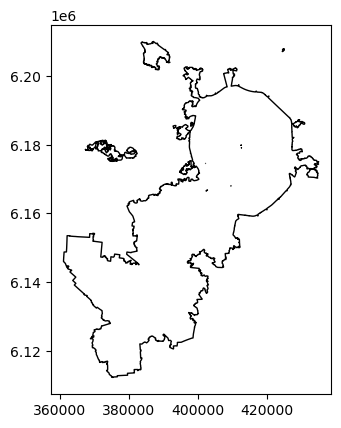

In [5]:
# Как видно, внутри полигонов остались мусорные линии
gdf_moscow_borders = gpd.read_file("moscow_borders.gpkg", use_arrow=True)
moscow_borders_unioned = gdf_moscow_borders.union_all()

gdf_moscow_borders_unioned = gpd.GeoDataFrame(geometry=[moscow_borders_unioned], crs=gdf_moscow_borders.crs)
gdf_moscow_borders_unioned.plot(facecolor="none", edgecolor="black")

m = folium.Map(location=[55.751244, 37.618423], zoom_start=15, crs="EPSG3857")
folium.GeoJson(gdf_moscow_borders_unioned).add_to(m)
m

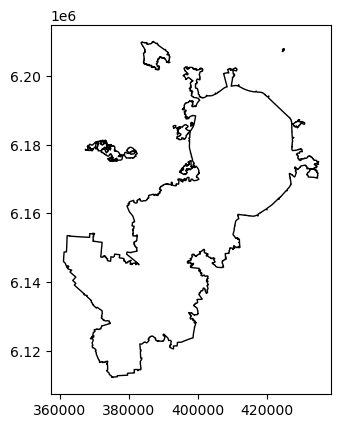

In [6]:
# А при использовании grid_size=1, полигоны объеденились корректно
gdf_moscow_borders = gpd.read_file("moscow_borders.gpkg", use_arrow=True)
moscow_borders_unioned_grid = gdf_moscow_borders.union_all(grid_size=1)

gdf_moscow_borders_unioned_grid = gpd.GeoDataFrame(geometry=[moscow_borders_unioned_grid], crs=gdf_moscow_borders.crs)
gdf_moscow_borders_unioned_grid.plot(facecolor="none", edgecolor="black")

m = folium.Map(location=[55.751244, 37.618423], zoom_start=15, crs="EPSG3857")
folium.GeoJson(gdf_moscow_borders_unioned_grid).add_to(m)
m

Такой подход отличается от простого округления координат тем, что сохраняются исходные координаты, а следовательно — точность геометрий. В Shapely, кстати, этот параметр есть ещё с конца 2022 года...<br>
https://shapely.readthedocs.io/en/stable/release/2.x.html#support-for-fixed-precision-model-for-geometries-and-in-overlay-functions<br>
А тут можно посмотреть, сколько функций адаптировалось с 2023 года.<br>
https://github.com/geopandas/geopandas/issues/2010

##### 3. GeoDataFrame.plot now supports pd.Index as an input for the column keyword.

Раньше для раскраски по индексу нужно было создать отдельную колонку.

<Axes: >

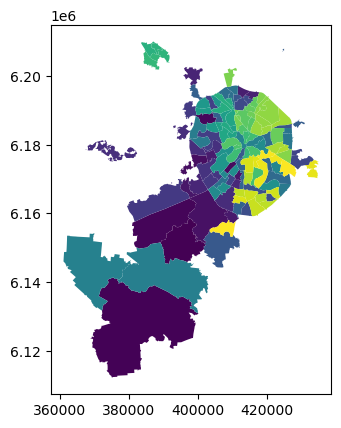

In [7]:
gdf_moscow_borders['index_col'] = gdf_moscow_borders.index
gdf_moscow_borders.plot(column='index_col')

Теперь можно передать индекс сразу.

<Axes: >

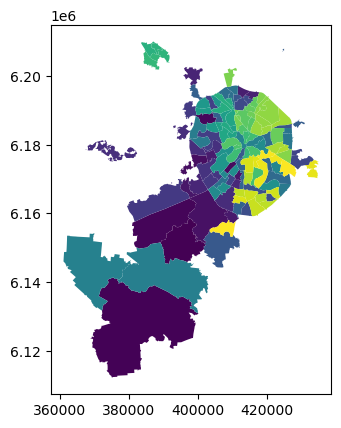

In [8]:
gdf_moscow_borders.plot(column=gdf_moscow_borders.index)

##### 4. Added disjoint_subset union algorithm for union_all and dissolve.
"disjoint_subset" use the disjoint subset union algorithm. This option is optimized for inputs that can be divided into subsets that do not intersect. If there is only one such subset, performance can be expected to be worse than "unary".

In [9]:
gdf_buildings = gpd.read_file("buildings.gpkg", use_arrow=True)
print(f"Количество строений в gdf_buildings: {len(gdf_buildings)}")
# Обе операции дали одинаковый результат, но вторая отработала в 30 раз быстрее
# Первая заняла порядка 3м20сек, а вторая 6сек
gdf_buildings_unioned_no_subset = gdf_buildings.union_all()
gdf_buildings_unioned_with_subset = gdf_buildings.union_all(method="disjoint_subset")
gdf_buildings.iloc[0:10000].explore()

Количество строений в gdf_buildings: 730699


##### 5. Added constrained_delaunay_triangles method to GeoSeries/GeoDataFrame.
A constrained Delaunay triangulation requires the edges of the input polygon(s) to be in the set of resulting triangle edges. An unconstrained delaunay triangulation only triangulates based on the vertices, hence triangle edges could cross polygon boundaries.

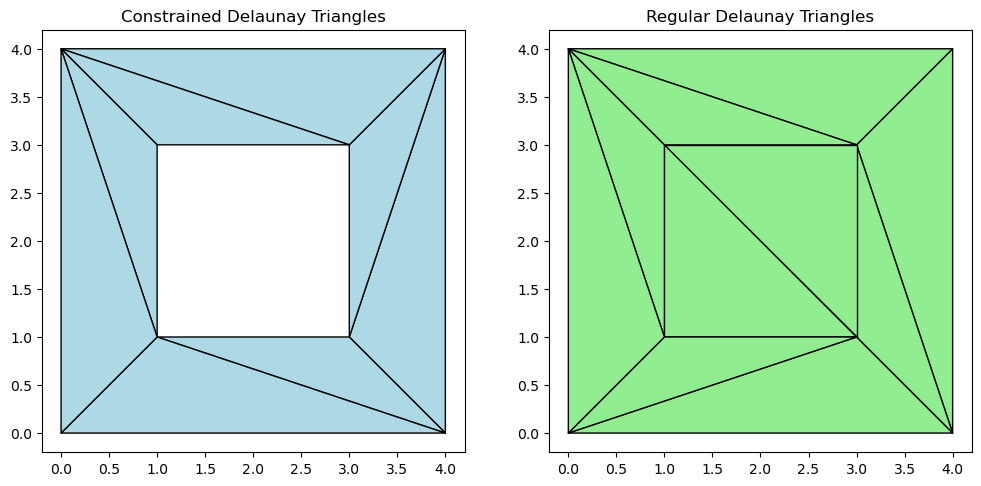

In [10]:
# Полигон с отверстием
exterior = [(0, 0), (4, 0), (4, 4), (0, 4), (0, 0)]
interior = [(1, 1), (1, 3), (3, 3), (3, 1), (1, 1)]
polygon = Polygon(exterior, [interior])

# Constrained delaunay - учитывает границы
tri_constrained = constrained_delaunay_triangles(polygon)

# Обычная delaunay - только по точкам
all_points = MultiPoint(exterior + interior)
tri_regular = delaunay_triangles(all_points)

# Визуализация
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
gpd.GeoSeries(tri_constrained).plot(ax=axs[0], edgecolor="black", facecolor="lightblue")
axs[0].set_title("Constrained Delaunay Triangles")
gpd.GeoSeries(tri_regular).plot(ax=axs[1], edgecolor="black", facecolor="lightgreen")
axs[1].set_title("Regular Delaunay Triangles")
plt.show()

##### 6. Added to_pandas_kwargs argument to from_arrow, read_parquet and read_feather to allow better control of conversion of non-geometric Arrow data to DataFrames.
Это не относится к геоданным, пропустим.

##### 7. Added is_valid_coverage and invalid_coverage_edges to GeoSeries/GeoDataFrame to allow validation of polygonal coverage.
Return a bool indicating whether a GeoSeries forms a valid coverage.<br>
A GeoSeries of valid polygons is considered a coverage if the polygons are:<br>
Non-overlapping - polygons do not overlap (their interiors do not intersect)<br>
Edge-Matched - vertices along shared edges are identical

Корректное покрытие: True
Разрыв в покрытии: True
Пересечение полигонов: False


C:\Users\Soskov_II\AppData\Local\Temp\ipykernel_17788\2745056665.py:30: UserWarning: The GeoSeries you are attempting to plot is composed of empty geometries. Nothing has been displayed.
  gpd.GeoSeries(invalid_edges_gap).plot(ax=axs[1], color="blue", linewidth=3)  # ошибки пустые, ибо нельзя определить рёбра


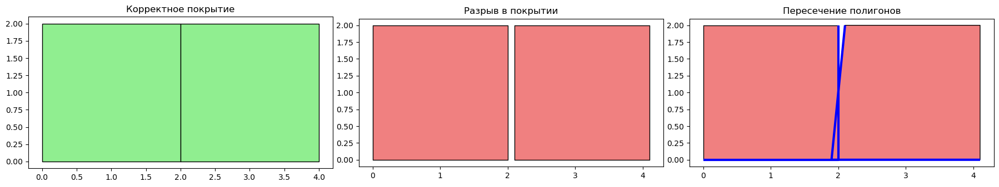

In [11]:
# Корректное покрытие: 2 полигона, идеально стыкуются
poly1 = Polygon([(0, 0), (2, 0), (2, 2), (0, 2)])
poly2 = Polygon([(2, 0), (4, 0), (4, 2), (2, 2)])
valid_geoms = [poly1, poly2]

# Некорректное покрытие: второй полигон немного смещён, есть зазор
poly3 = Polygon([(2.1, 0), (4.1, 0), (4.1, 2), (2.1, 2)])
invalid_geoms_gap = [poly1, poly3]

# Неправильное покрытие: второй полигон пересекает первый
poly4 = Polygon([(1.9, 0), (4.1, 0), (4.1, 2), (2.1, 2)])
invalid_geoms_crossed = [poly1, poly4]

# Проверка валидности
print("Корректное покрытие:", coverage_is_valid(valid_geoms))
print("Разрыв в покрытии:", coverage_is_valid(invalid_geoms_gap))
print("Пересечение полигонов:", coverage_is_valid(invalid_geoms_crossed))

# Получим ошибки в покрытии
invalid_edges_gap = coverage_invalid_edges(invalid_geoms_gap)
invalid_edges_crossed = coverage_invalid_edges(invalid_geoms_crossed)

# Визуализация всех трёх случаев
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

gpd.GeoSeries(valid_geoms).plot(ax=axs[0], facecolor="lightgreen", edgecolor="black")
axs[0].set_title("Корректное покрытие")

gpd.GeoSeries(invalid_geoms_gap).plot(ax=axs[1], facecolor="lightcoral", edgecolor="black")
gpd.GeoSeries(invalid_edges_gap).plot(ax=axs[1], color="blue", linewidth=3)  # ошибки пустые, ибо нельзя определить рёбра
axs[1].set_title("Разрыв в покрытии")

gpd.GeoSeries(invalid_geoms_crossed).plot(ax=axs[2], facecolor="lightcoral", edgecolor="black")
gpd.GeoSeries(invalid_edges_crossed).plot(ax=axs[2], color="blue", linewidth=3)
axs[2].set_title("Пересечение полигонов")

plt.tight_layout()
plt.show()

##### 8. Added maximum_inscribed_circle method from shapely to GeoSeries/GeoDataFrame.
Return a GeoSeries of geometries representing the largest circle that is fully contained within the input geometry.

Вписанная линия:
LINESTRING (5 5, 0 5)


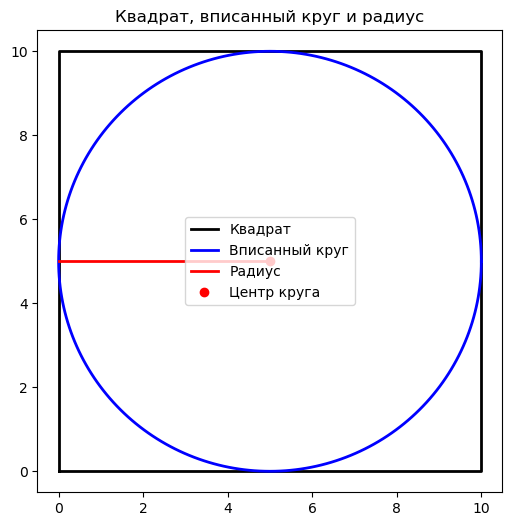

In [12]:
# Создаём квадрат
poly = Polygon([(0, 0), (0, 10), (10, 10), (10, 0), (0, 0)])

# Находим максимальный вписанный круг (возвращается линия: центр-линия к ближайшей точке контура)
inscribed_line = maximum_inscribed_circle(poly)
print("Вписанная линия:")
print(inscribed_line)

# Получаем центр и радиус круга, создаём круг как полигон
center = inscribed_line.coords[0]
radius = Point(center).distance(Point(inscribed_line.coords[1]))
circle = Point(center).buffer(radius, resolution=64)

# Визуализация
fig, ax = plt.subplots(figsize=(6, 6))
x, y = poly.exterior.xy
ax.plot(x, y, color="black", linewidth=2, label="Квадрат")
circle_x, circle_y = circle.exterior.xy
ax.plot(circle_x, circle_y, color="blue", linewidth=2, label="Вписанный круг")
line_x, line_y = zip(*inscribed_line.coords)
ax.plot(line_x, line_y, color="red", linewidth=2, label="Радиус")
ax.plot(center[0], center[1], "ro", label="Центр круга")

ax.legend()
plt.title("Квадрат, вписанный круг и радиус")
plt.show()

##### 9. Added minimum_clearance_line method from shapely to GeoSeries/GeoDataFrame.
Return a LineString whose endpoints define the minimum clearance.<br>
A geometry’s “minimum clearance” is the smallest distance by which a vertex of the geometry could be moved to produce an invalid geometry.

Можно сказать, что minimum_clearance_line — это линия, отображающая минимальное расстояние в геометрии до её "схлопывания" в некорректную геометрию.

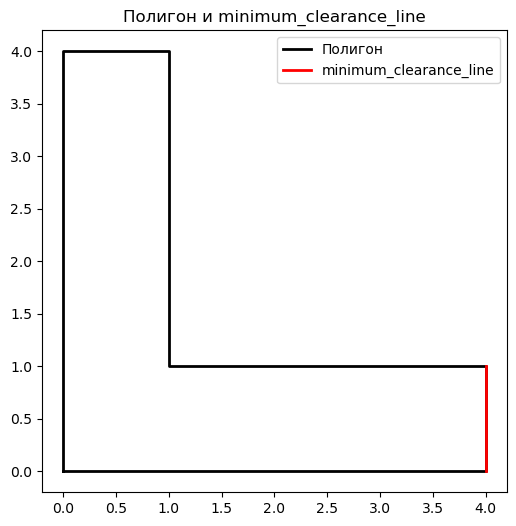

In [13]:
poly = Polygon([(0, 0), (4, 0), (4, 1), (1, 1), (1, 4), (0, 4), (0, 0)])
line = minimum_clearance_line(poly)

fig, ax = plt.subplots(figsize=(6, 6))
x, y = poly.exterior.xy
ax.plot(x, y, color="black", linewidth=2, label="Полигон")
line_x, line_y = zip(*line.coords)
ax.plot(line_x, line_y, color="red", linewidth=2, label="minimum_clearance_line")
ax.legend()
plt.title("Полигон и minimum_clearance_line")
plt.show()

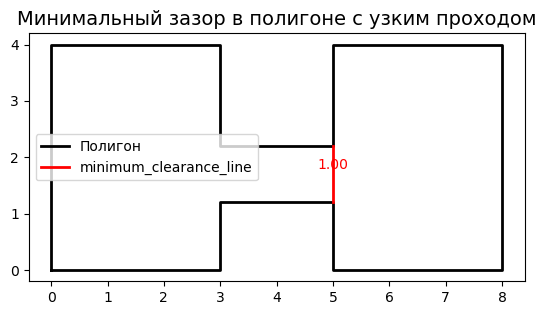

In [14]:
# Пример геометрии с узким каналом
poly = Polygon([(0, 0), (3, 0), (3, 1.2), (5, 1.2), (5, 0), (8, 0), (8, 4), (5, 4), (5, 2.2), (3, 2.2), (3, 4), (0, 4), (0, 0)])

# Находим minimum_clearance_line
mcl = minimum_clearance_line(poly)

# Визуализация
fig, ax = plt.subplots()
x, y = poly.exterior.xy
ax.plot(x, y, color="black", linewidth=2, label="Полигон")
mcl_x, mcl_y = zip(*mcl.coords)
ax.plot(mcl_x, mcl_y, color="red", linewidth=2, label="minimum_clearance_line")

start, end = mcl.coords[0], mcl.coords[1]
mid = ((start[0] + end[0]) / 2, (start[1] + end[1]) / 2)
ax.text(mid[0], mid[1] + 0.1, f"{mcl.length:.2f}", color="red", ha="center")

ax.set_title("Минимальный зазор в полигоне с узким проходом", fontsize=14)
ax.set_aspect("equal")
ax.legend()
plt.show()

##### 10. Added orient_polygons method from shapely to GeoSeries/GeoDataFrame.
Return a GeoSeries of geometries with enforced ring orientation. Forces (Multi)Polygons to use a counter-clockwise orientation for their exterior ring, and a clockwise orientation for their interior rings.

In [15]:
# Пример из документации geopandas
pol_for_orient = gpd.GeoSeries(
    [
        Polygon(
            [(0, 0), (0, 10), (10, 10), (10, 0), (0, 0)],
            holes=[[(2, 2), (2, 4), (4, 4), (4, 2), (2, 2)]],
        ),
    ],
)
print("До ориентации:")
print(pol_for_orient.geometry[0])
print("После ориентации:")
print(pol_for_orient.orient_polygons().geometry[0])

До ориентации:
POLYGON ((0 0, 0 10, 10 10, 10 0, 0 0), (2 2, 2 4, 4 4, 4 2, 2 2))
После ориентации:
POLYGON ((0 0, 10 0, 10 10, 0 10, 0 0), (2 2, 2 4, 4 4, 4 2, 2 2))


##### 11. Added method and keep_collapsed argument to make_valid.
method : linework/structure - Algorithm to use when repairing geometry<br>
keep_collapsed : bool - For the ‘structure’ method, True will keep components that have collapsed into a lower dimensionality. For example, a ring collapsing to a line, or a line collapsing to a point. Must be True for the ‘linework’ method.

Добавили методы аналогично тому как они есть в QGIS.<br>

Результат применения метода linework:<br>
Основная цель — сохранить все рёбра и вершины.<br>
Геометрия разбивается на «noded lines» (линии с узлами), из которых извлекаются валидные области, используя правила «чётного‑нечётного» (even‑odd) определения внутренней области.<br>
Может приводить к сложным MultiPolygon или GeometryCollection структурам.<br>

Результат применения метода structure:<br>
Акцент на логическом восстановлении структуры: внешние кольца — это оболочки, внутренние — дупла.<br>
Сначала корректируются все кольца, затем оболочки объединяются, а дупла вычитаются из них, создавая более «интуитивную» валидную геометрию, при этом предполагается, что типы колец (внешние/внутренние) уже заданы правильно. 

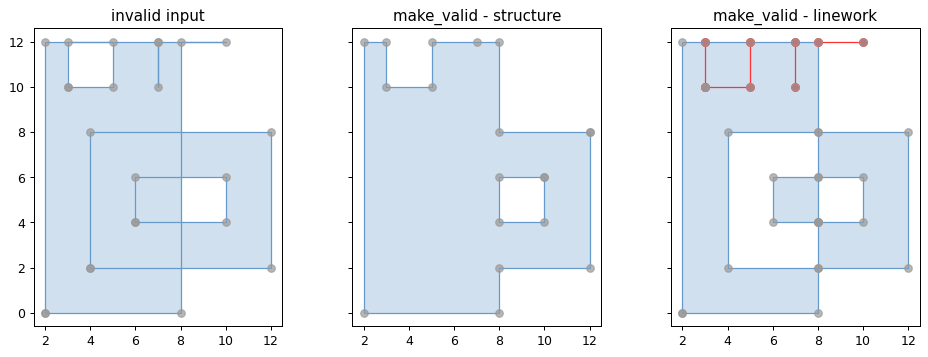

In [ ]:
# Пример из документации shapely
# https://shapely.readthedocs.io/en/stable/manual.html#shapely.make_valid
# Также можно посмотреть тут - https://postgis.net/docs/ST_MakeValid.html

BLUE = "#6699cc"
GRAY = "#999999"
RED = "#ff3333"

input = shapely.MultiPolygon(
    [
        shapely.Polygon(
            [
                (2, 0),
                (2, 12),
                (7, 12),
                (7, 10),
                (7, 12),
                (10, 12),
                (8, 12),
                (8, 0),
                (2, 0),
            ],
            [[(3, 10), (5, 10), (5, 12), (3, 12), (3, 10)]],
        ),
        shapely.Polygon(
            [(4, 2), (4, 8), (12, 8), (12, 2), (4, 2)],
            [[(6, 4), (10, 4), (10, 6), (6, 6), (6, 4)]],
        ),
    ]
)

fig, ax = plt.subplots(1, 3, sharex=True, sharey=True, figsize=(11, 4), dpi=90)
plot_polygon(input, ax=ax[0], add_points=False, color=BLUE)
plot_points(input, ax=ax[0], color=GRAY, alpha=0.7)
ax[0].set_title("invalid input")
ax[0].set_aspect("equal")

# Structure makevalid
valid_structure = shapely.make_valid(input, method="structure", keep_collapsed=True)
plot_polygon(valid_structure, ax=ax[1], add_points=False, color=BLUE)
plot_points(valid_structure, ax=ax[1], color=GRAY, alpha=0.7)

ax[1].set_title("make_valid - structure")
ax[1].set_aspect("equal")

# Linework makevalid
valid_linework = shapely.make_valid(input)
for geom in valid_linework.geoms:
    if isinstance(geom, shapely.MultiPolygon):
        plot_polygon(geom, ax=ax[2], add_points=False, color=BLUE)
        plot_points(geom, ax=ax[2], color=GRAY, alpha=0.7)
    else:
        plot_line(geom, ax=ax[2], color=RED, linewidth=1)
        plot_points(geom, ax=ax[2], color=GRAY, alpha=0.7)
ax[2].set_title("make_valid - linework")
ax[2].set_aspect("equal")

fig.tight_layout()
plt.show()

##### 12. Added simplify_coverage method for topological simplification of polygonal coverages to GeoSeries/GeoDataFrame.
Return a GeoSeries containing a simplified representation of polygonal coverage.<br>
Assumes that the GeoSeries forms a polygonal coverage. Under this assumption, the method simplifies the edges using the Visvalingam-Whyatt algorithm, while preserving a valid coverage. In the most simplified case, polygons are reduced to triangles.

In [17]:
gdf_moscow_borders = gpd.read_file("moscow_borders.gpkg", use_arrow=True)
gdf_moscow_borders_simplified = gdf_moscow_borders.simplify_coverage(tolerance=100)
gdf_moscow_borders_simplified_no_boundary = gdf_moscow_borders.simplify_coverage(tolerance=100, simplify_boundary=False)

m = folium.Map(
    location=[55.881447, 37.726627],
    zoom_start=15,
    crs="EPSG3857",
    tiles="https://a.basemaps.cartocdn.com/light_nolabels/{z}/{x}/{y}@2x.png",
    attr='&copy; <a href="https://carto.com/attributions">CARTO</a>',
    name="CartoDB Positron No Labels Retina",
)
# Добавляем исходные границы без заливки
folium.GeoJson(
    gdf_moscow_borders,
    name="Исходные границы",
    style_function=lambda x: {
        "color": "blue",
        "weight": 2,
        "fillOpacity": 0,
    },
).add_to(m)

# Добавляем упрощённые границы без заливки
folium.GeoJson(
    gdf_moscow_borders_simplified,
    name="Упрощённые границы (по умолчанию)",
    style_function=lambda x: {
        "color": "red",
        "weight": 2,
        "fillOpacity": 0,
    },
).add_to(m)

# Добавляем упрощённые границы с simplify_boundary=False
folium.GeoJson(
    gdf_moscow_borders_simplified_no_boundary,
    name="Упрощённые границы (simplify_boundary=False)",
    style_function=lambda x: {
        "color": "green",
        "weight": 2,
        "fillOpacity": 0,
    },
).add_to(m)

folium.LayerControl().add_to(m)

# Добавляем легенду
legend_html = """
     <div style="
         position: fixed; 
         bottom: 50px; left: 50px; width: 380px; height: 110px; 
         background-color: white; 
         border:2px solid grey; z-index:9999; font-size:14px;
         padding: 10px;
         ">
     <b>Условные обозначения:</b><br>
     <span style="color:blue; font-weight:bold;">&#9632;</span> Исходные границы<br>
     <span style="color:red; font-weight:bold;">&#9632;</span> Упрощённые границы (по умолчанию)<br>
     <span style="color:green; font-weight:bold;">&#9632;</span> Упрощённые границы (simplify_boundary=False)
     </div>
     """
m.get_root().html.add_child(folium.Element(legend_html))
m

##### 13. Added initial support of M coordinates (m and has_m properties, include_m in get_coordinates).
Координата m (или "measure") — это дополнительная, вспомогательная координата, которая используется в геопространственных данных (например, в форматах GeoJSON, shapefile и др.) вместе с координатами x, y (широта и долгота) и z (высота). Таким образом, полный набор координат может быть [x, y, z, m].

##### 14. Added geom_equals_identical method exposing equals_identical from shapely to GeoSeries/GeoDataFrame
Ещё один вариант сравнения геометрий, по аналогии с geom_equals и geom_equals_exact. Разница понятна из описания всех трёх методов в документации.

##### 15. GeoPandas now attempts to use a range request when reading from an URL even if the header does not directly indicate its support 
Не относится к обработке геометрии, пропускаем.

##### 16. Added geopandas.accessors module. Import this module to register a pandas.Series.geo accessor, which exposes GeoSeries methods via pandas’s extension mechanism.
В pandas accessor — это механизм, который позволяет расширить функциональность Series или DataFrame, добавляя "точечный" доступ к специфическим методам. Примеры:<br>
.str — для работы со строками<br>
.dt — для работы с датами<br>
.cat — для категориальных данных

Теперь в GeoPandas есть:<br>
.geo — для работы с геометрическими объектами внутри pandas.Series

0    POLYGON ((1 0, 0.99518 -0.09802, 0.98079 -0.19...
1    POLYGON ((2 1, 1.99518 0.90198, 1.98079 0.8049...
dtype: geometry


<Axes: >

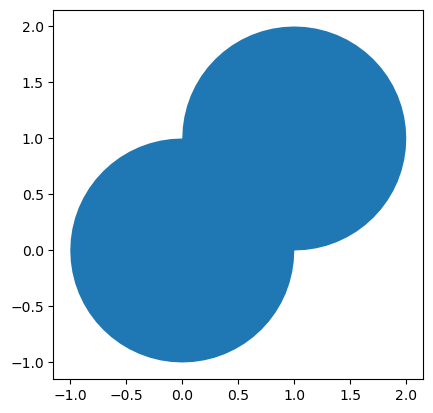

In [18]:
import geopandas.accessors

s = pd.Series([Point(0, 0), Point(1, 1)], dtype="geometry")
# buffers = s.buffer(1) — вызовет ошибку
buffers = s.geo.buffer(1)
print(buffers)

# Но при этом если Series не имеет dtype='geometry', то методы не доступны
s = pd.Series([Point(0, 0), Point(1, 1)])
# buffers = s.geo.buffer(1) — также вызовет ошибку
buffers.plot()